In [13]:
import numpy as np
import matplotlib.pyplot as plt
import json
from pathlib import Path

# Configuration
OUTPUT_DIR = Path('./output')
NUM_SIGNALS_TO_PLOT = 10
RANDOM_SEED = 123  # For reproducible selection

print(f"Output directory: {OUTPUT_DIR.absolute()}")

Output directory: /Users/julius3005/Library/CloudStorage/GoogleDrive-julius3005@gmail.com/My Drive/A2025-2026 Semestre 1/UCO/FirstArticle/ArticleScientificData/SignalBuilderCLI/output


## Load Dataset Summary

In [14]:
# Load dataset summary
with open(OUTPUT_DIR / 'dataset_summary.json', 'r') as f:
    summary = json.load(f)

print("Dataset Summary:")
print(f"  - Number of signals: {summary['num_signals']}")
print(f"  - High-resolution samples: {summary['n_samples_high']}")
print(f"  - Subsample sizes: {summary['subsample_sizes']}")
print(f"  - Subsample method: {summary['subsample_method']}")
print(f"  - Generation seed: {summary['seed_used']}")

Dataset Summary:
  - Number of signals: 50
  - High-resolution samples: 5000
  - Subsample sizes: [150, 250, 500, 1000]
  - Subsample method: simple
  - Generation seed: 42


## Load All Signal Data

In [15]:
# Load high-resolution signals
high_res_data = np.load(OUTPUT_DIR / f"signals_high_resolution_{summary['n_samples_high']}.npz")
signals_high = high_res_data['signals']
t_high = high_res_data['t']
clean_signals_high = high_res_data['clean_signals']

print(f"High-resolution signals shape: {signals_high.shape}")
print(f"Time array shape: {t_high.shape}")

# Load subsampled signals
subsample_sizes = summary['subsample_sizes']
subsampled_data = {}

for size in subsample_sizes:
    filename = f"signals_subsampled_{summary['subsample_method']}_{size}.npz"
    data = np.load(OUTPUT_DIR / filename)
    subsampled_data[size] = {
        'signals': data['signals'],
        't': data['t']
    }
    print(f"Loaded subsampled signals at {size} points: shape {data['signals'].shape}")

High-resolution signals shape: (50, 5000)
Time array shape: (5000,)
Loaded subsampled signals at 150 points: shape (50, 150)
Loaded subsampled signals at 250 points: shape (50, 250)
Loaded subsampled signals at 500 points: shape (50, 500)
Loaded subsampled signals at 1000 points: shape (50, 1000)


## Select Random Signals to Visualize

In [16]:
# Select random signal indices
rng = np.random.default_rng(RANDOM_SEED)
num_total_signals = signals_high.shape[0]
selected_indices = rng.choice(num_total_signals, size=NUM_SIGNALS_TO_PLOT, replace=False)
selected_indices = np.sort(selected_indices)

print(f"Selected {NUM_SIGNALS_TO_PLOT} signals from {num_total_signals} total signals")
print(f"Signal indices: {selected_indices}")

Selected 10 signals from 50 total signals
Signal indices: [ 0  2  8 10 11 16 25 28 40 49]


## Visualization: High-Resolution vs All Subsampled Versions

For each selected signal, we plot:
1. High-resolution signal (5000 samples)
2. Subsampled at 1000 samples
3. Subsampled at 500 samples
4. Subsampled at 250 samples
5. Subsampled at 150 samples

In [17]:
# Color palette for different resolutions
colors = {
    'high': '#2E86AB',      # Blue - high resolution
    1000: '#A23B72',        # Pink
    500: '#F18F01',         # Orange
    250: '#C73E1D',         # Red
    150: '#3B1F2B',         # Dark purple
}

# Plot configuration
plt.rcParams['figure.figsize'] = [14, 4]
plt.rcParams['font.size'] = 10
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.3

In [18]:
def plot_signal_comparison(idx, signals_high, t_high, subsampled_data, subsample_sizes):
    """
    Plot a single signal at all resolutions in one figure with subplots.
    """
    n_plots = 1 + len(subsample_sizes)  # High-res + subsampled versions
    fig, axes = plt.subplots(n_plots, 1, figsize=(14, 3 * n_plots))
    
    # Plot high-resolution signal
    axes[0].plot(t_high, signals_high[idx], color=colors['high'], linewidth=0.8, alpha=0.9)
    axes[0].set_title(f'Signal {idx} - High Resolution ({len(t_high)} samples)', fontweight='bold')
    axes[0].set_xlabel('Time')
    axes[0].set_ylabel('Amplitude')
    axes[0].set_xlim([t_high[0], t_high[-1]])
    
    # Plot subsampled versions (from highest to lowest resolution)
    sorted_sizes = sorted(subsample_sizes, reverse=True)
    for i, size in enumerate(sorted_sizes):
        ax = axes[i + 1]
        t_sub = subsampled_data[size]['t']
        signal_sub = subsampled_data[size]['signals'][idx]
        
        # Plot subsampled signal
        ax.plot(t_sub, signal_sub, color=colors[size], linewidth=1.2, alpha=0.9,
                marker='o', markersize=2 if size <= 250 else 0)
        
        # Add high-res reference in background
        ax.plot(t_high, signals_high[idx], color=colors['high'], linewidth=0.5, 
                alpha=0.3, label='High-res (reference)')
        
        ax.set_title(f'Subsampled at {size} samples', fontweight='bold')
        ax.set_xlabel('Time')
        ax.set_ylabel('Amplitude')
        ax.set_xlim([t_high[0], t_high[-1]])
        ax.legend(loc='upper right', fontsize=8)
    
    plt.tight_layout()
    plt.suptitle(f'Signal {idx} - All Resolutions Comparison', fontsize=14, fontweight='bold', y=1.01)
    plt.show()
    return fig

## Generate All Plots

For each of the 10 selected signals, we create a figure with 5 subplots (high-res + 4 subsampled versions).

Generating 10 figures with 5 plots each...
Total plots: 50


SIGNAL 0


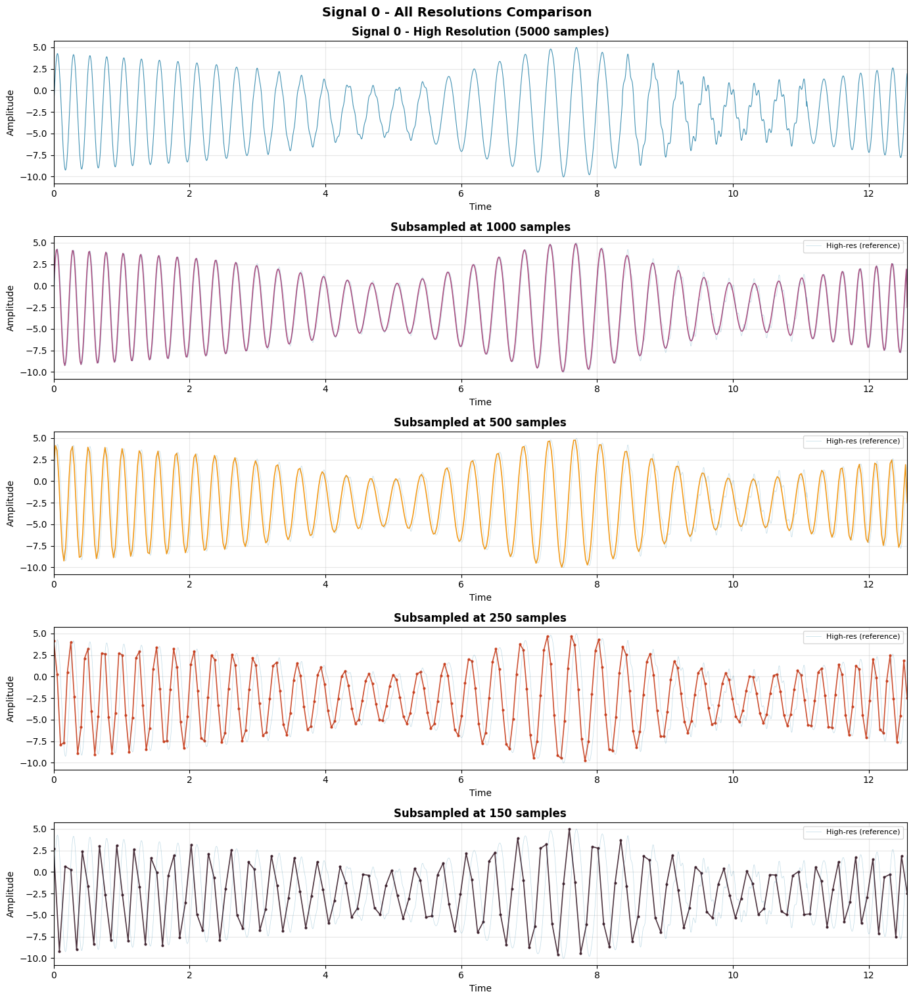


SIGNAL 2


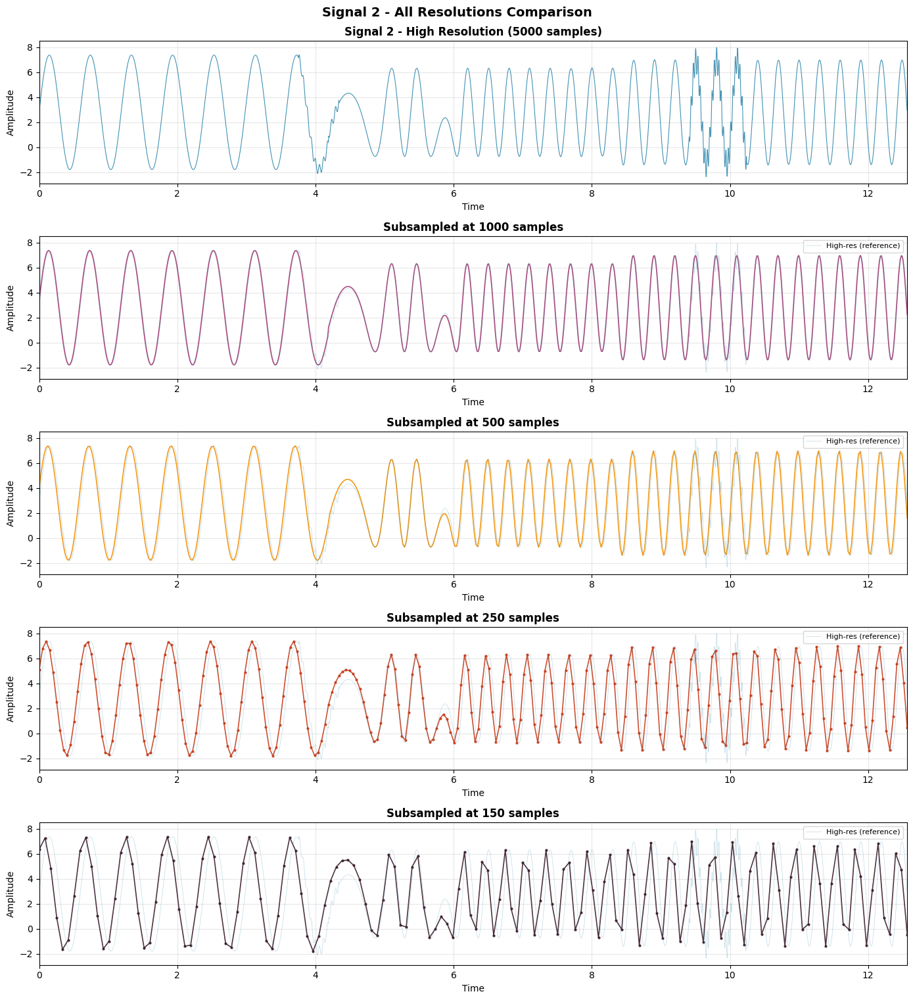


SIGNAL 8


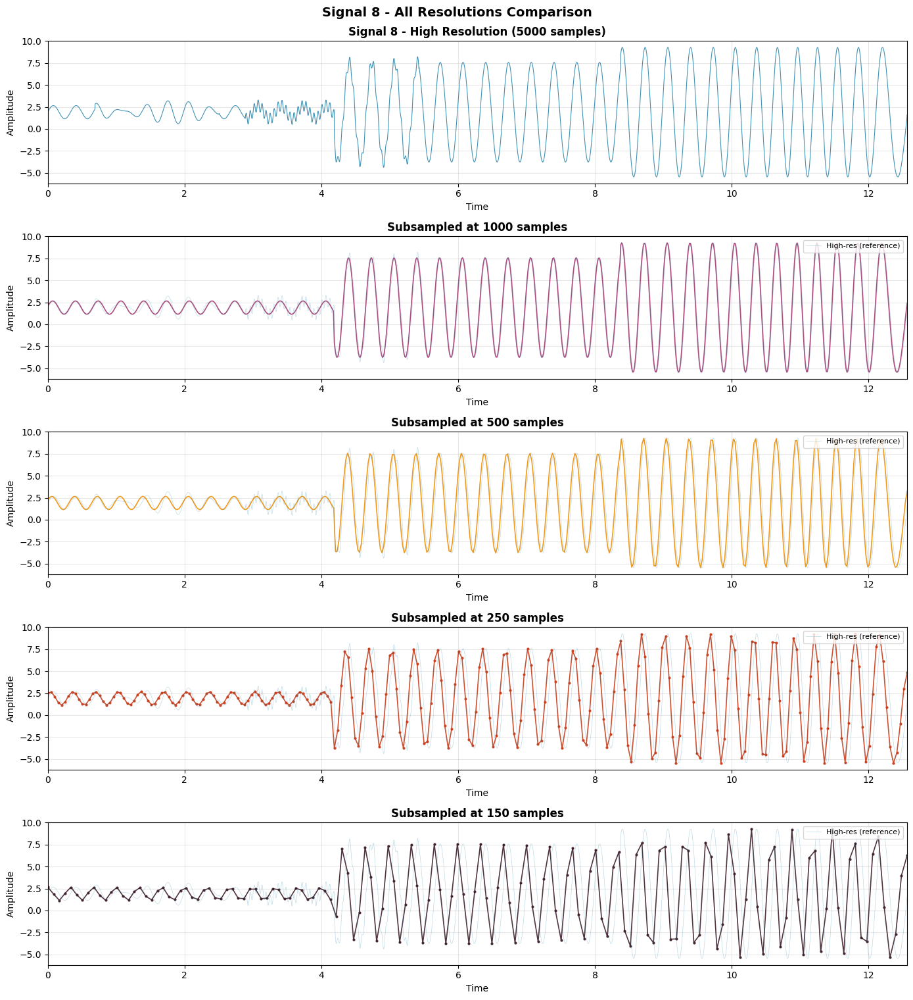


SIGNAL 10


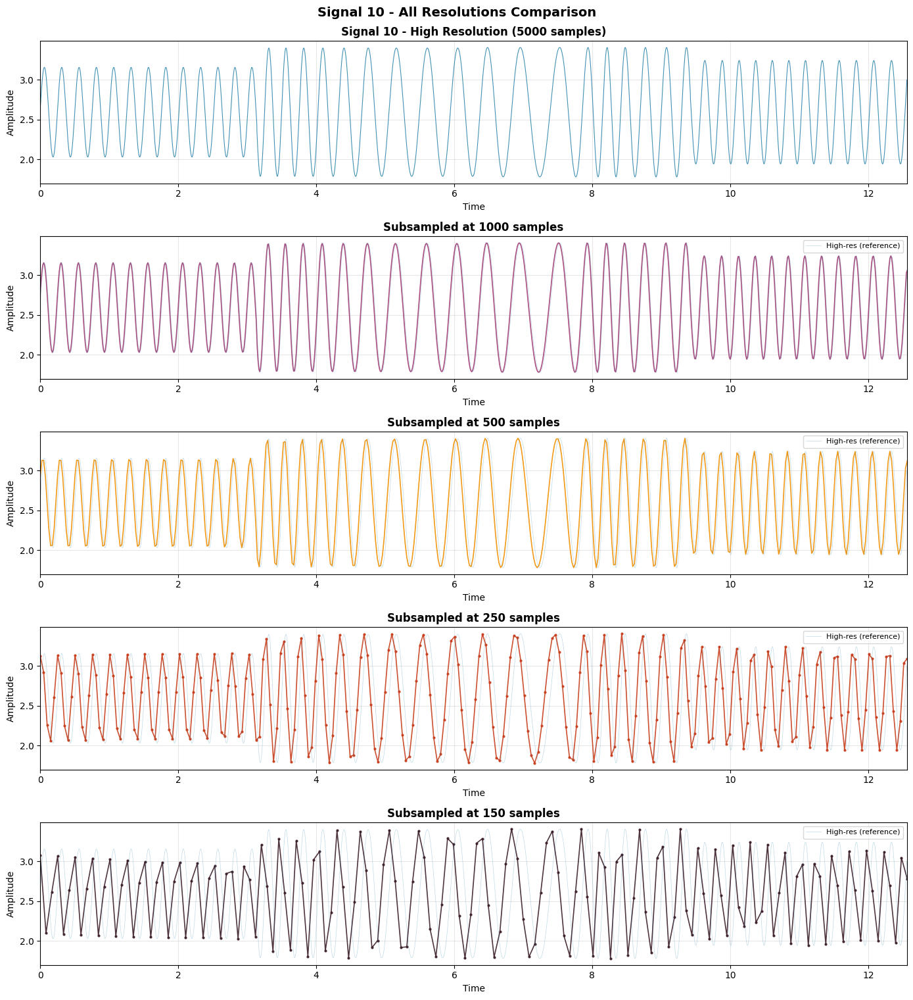


SIGNAL 11


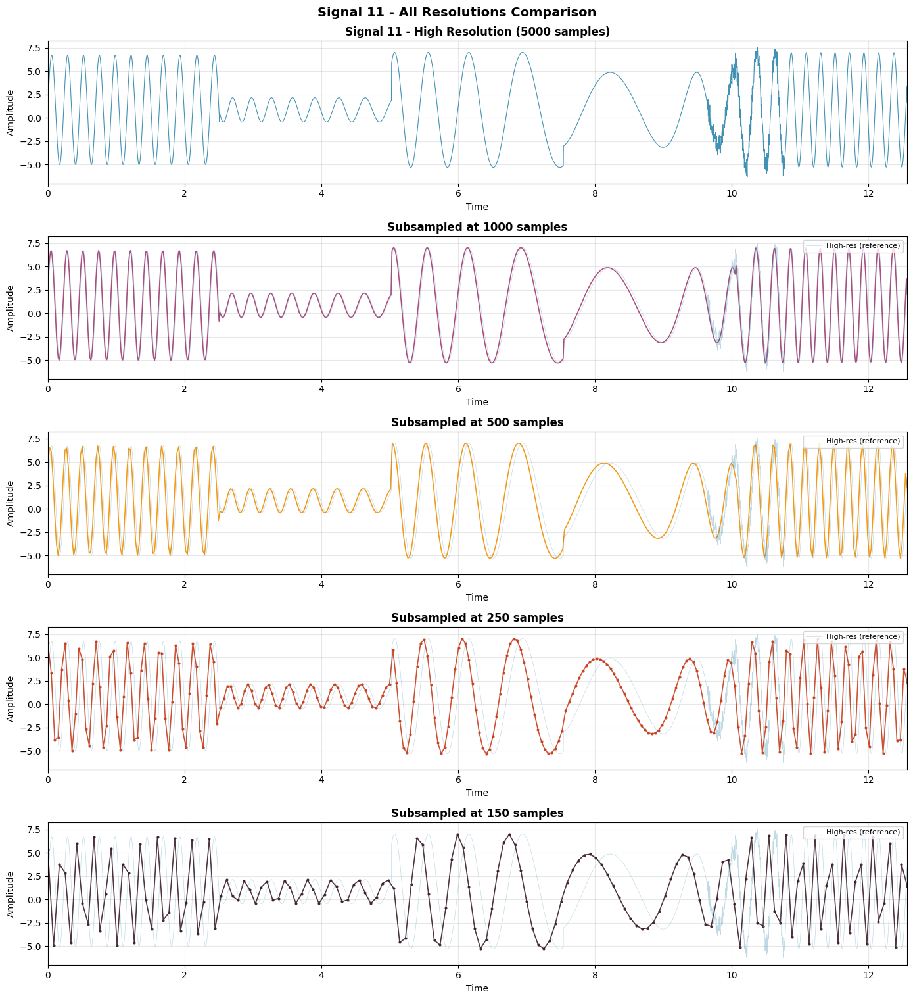


SIGNAL 16


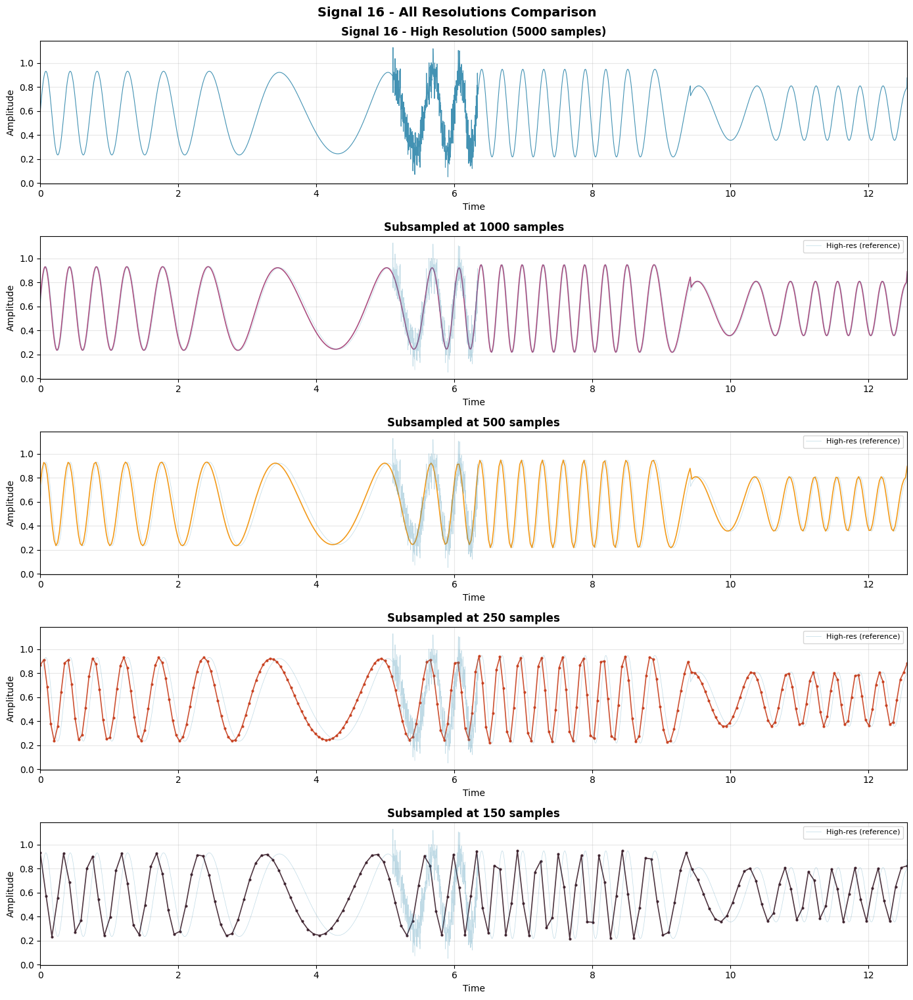


SIGNAL 25


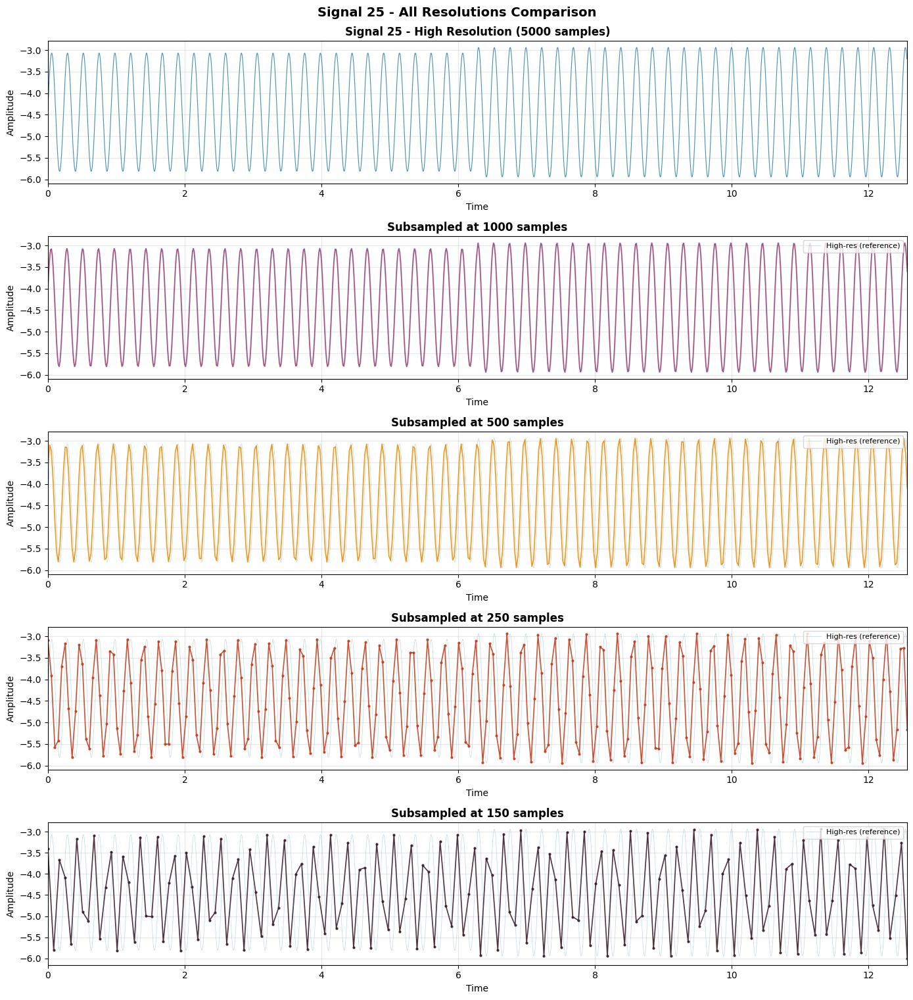


SIGNAL 28


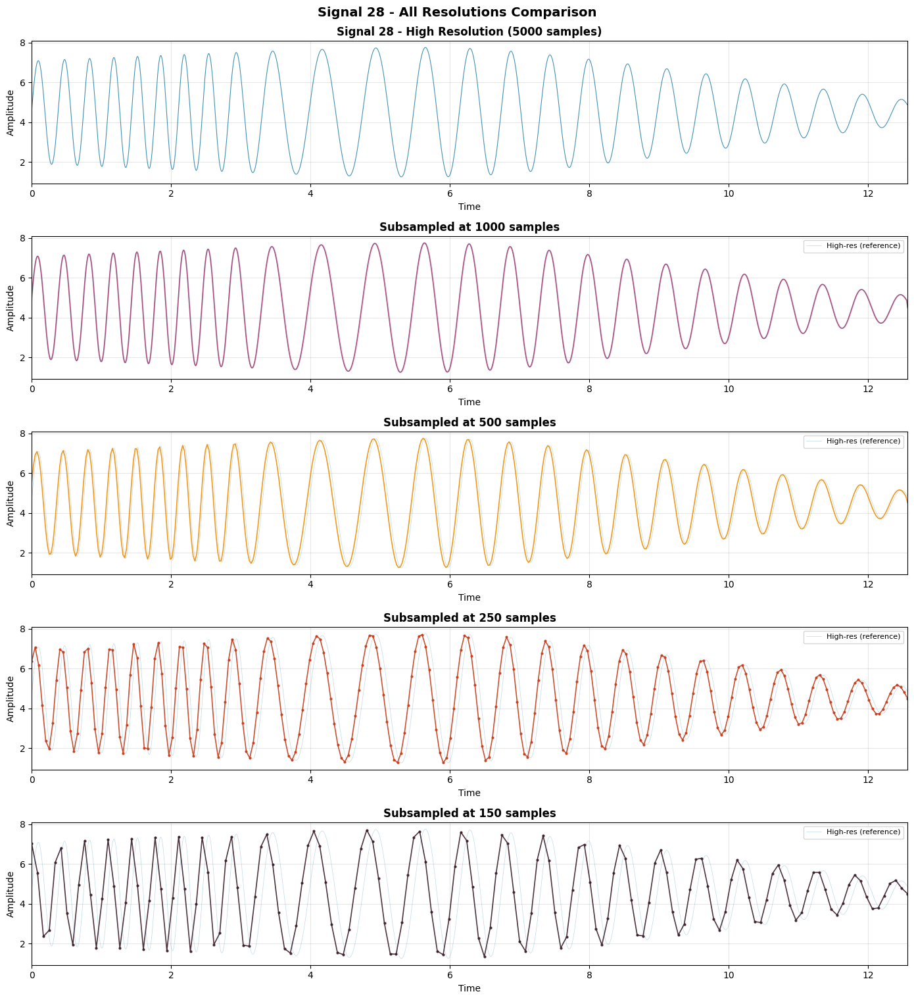


SIGNAL 40


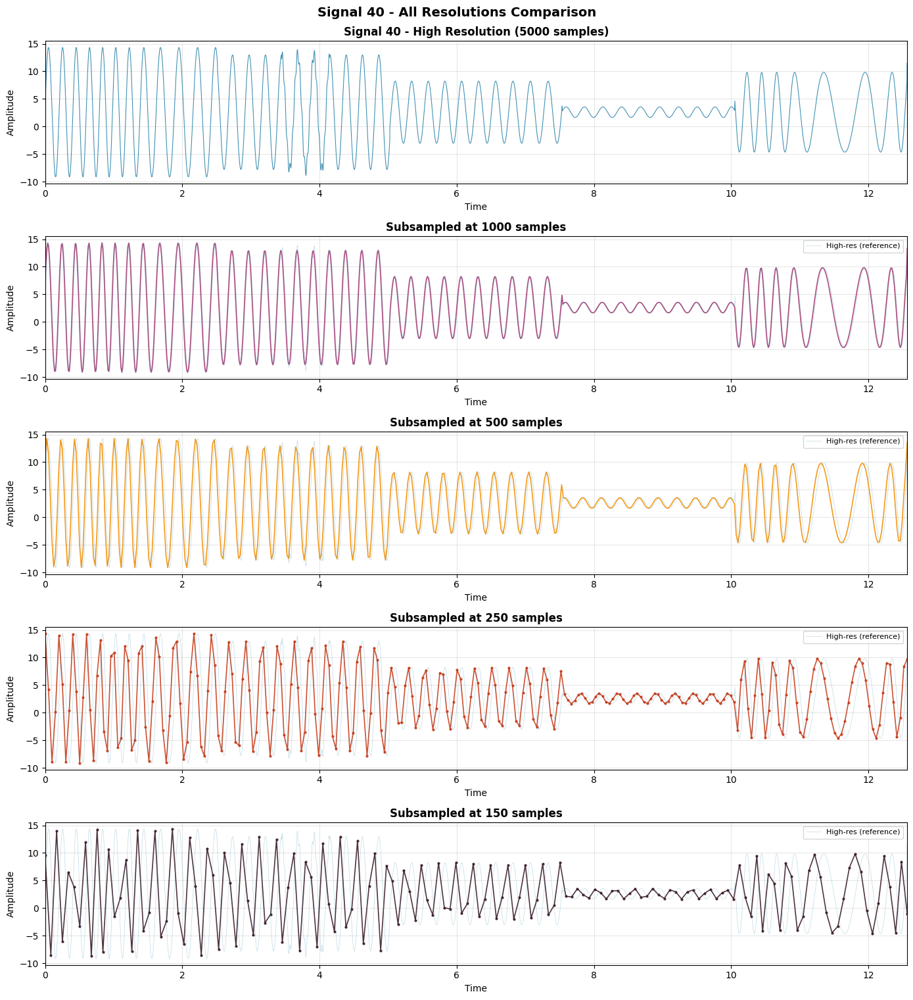


SIGNAL 49


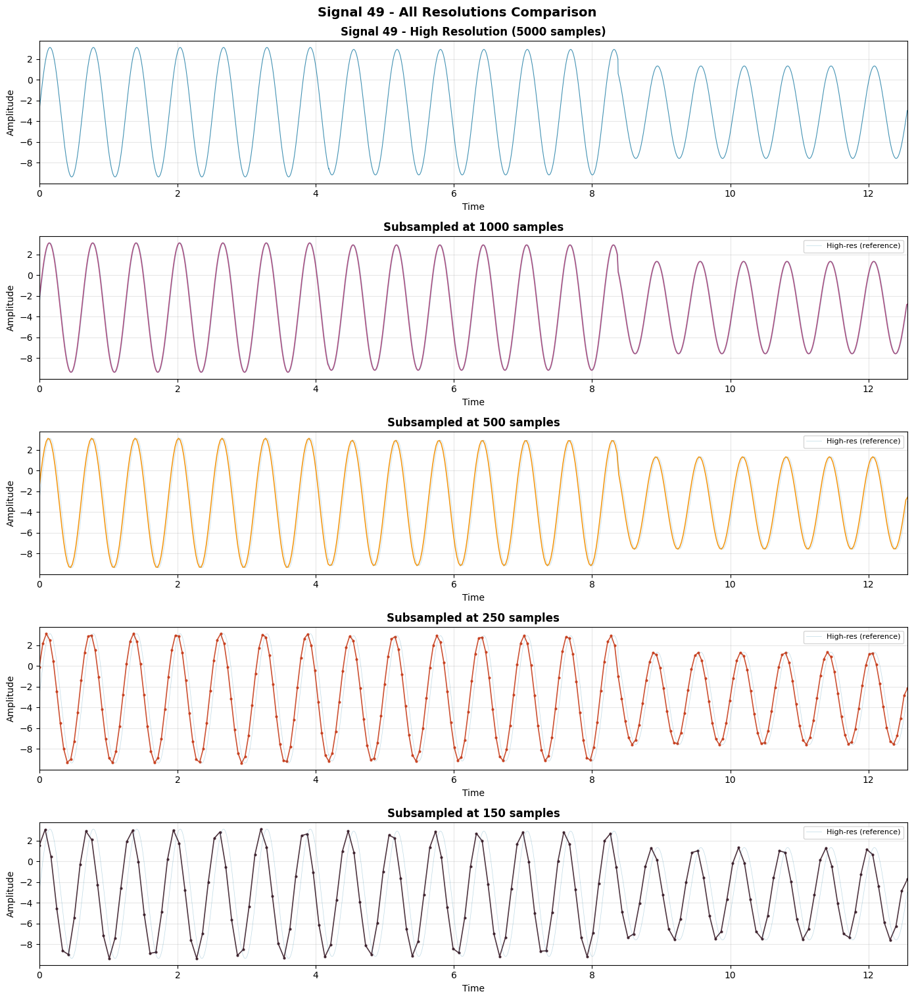

In [19]:
# Generate plots for all selected signals
print(f"Generating {NUM_SIGNALS_TO_PLOT} figures with {1 + len(subsample_sizes)} plots each...")
print(f"Total plots: {NUM_SIGNALS_TO_PLOT * (1 + len(subsample_sizes))}\n")

for idx in selected_indices:
    print(f"\n{'='*60}")
    print(f"SIGNAL {idx}")
    print(f"{'='*60}")
    plot_signal_comparison(idx, signals_high, t_high, subsampled_data, subsample_sizes)

## Overlay Comparison

Alternative visualization: All resolutions overlaid in a single plot for each signal.

In [20]:
def plot_signal_overlay(idx, signals_high, t_high, subsampled_data, subsample_sizes):
    """
    Plot all resolutions of a signal overlaid in a single figure.
    """
    fig, ax = plt.subplots(figsize=(14, 5))
    
    # Plot high-resolution signal first (background)
    ax.plot(t_high, signals_high[idx], color=colors['high'], linewidth=1.5, 
            alpha=0.8, label=f'High-res ({len(t_high)} pts)', zorder=1)
    
    # Plot subsampled versions (from lowest to highest resolution for better visibility)
    sorted_sizes = sorted(subsample_sizes)
    for size in sorted_sizes:
        t_sub = subsampled_data[size]['t']
        signal_sub = subsampled_data[size]['signals'][idx]
        
        ax.plot(t_sub, signal_sub, color=colors[size], linewidth=1.0, alpha=0.7,
                marker='o', markersize=3 if size <= 250 else 1,
                label=f'{size} pts', zorder=2)
    
    ax.set_title(f'Signal {idx} - All Resolutions Overlay', fontsize=14, fontweight='bold')
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Amplitude', fontsize=12)
    ax.set_xlim([t_high[0], t_high[-1]])
    ax.legend(loc='best', fontsize=10)
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    return fig

Generating overlay comparison plots...



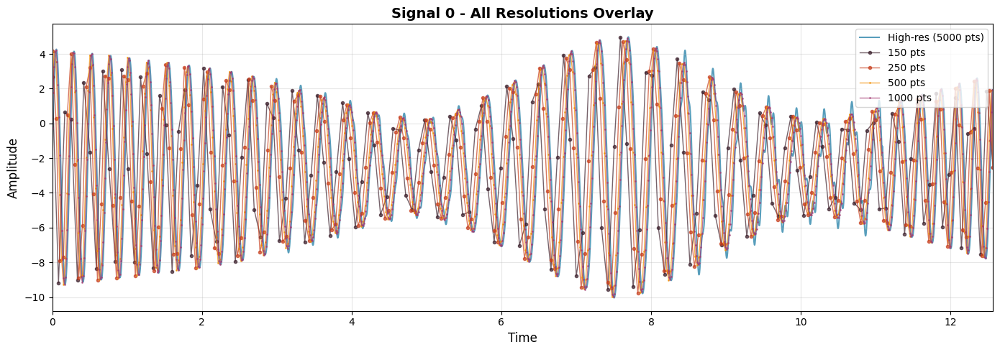

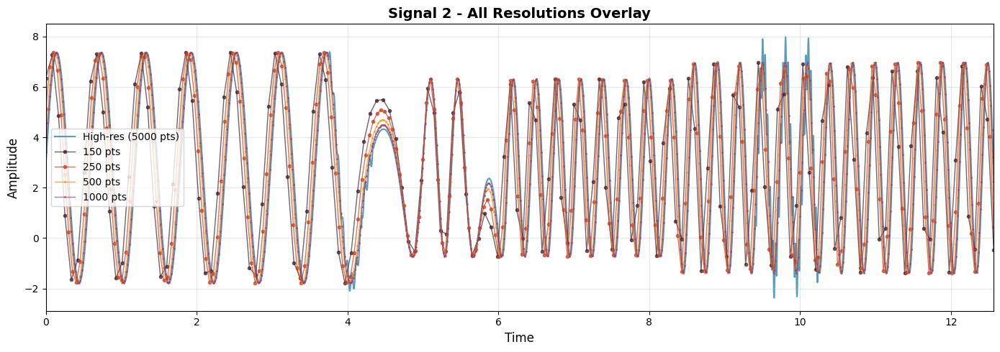

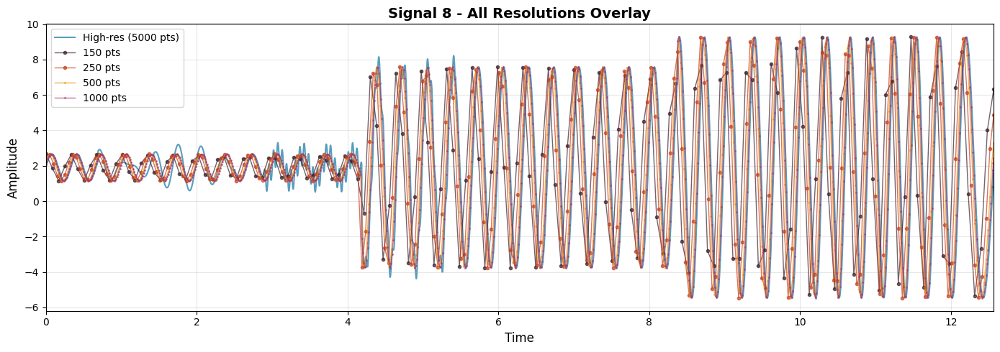

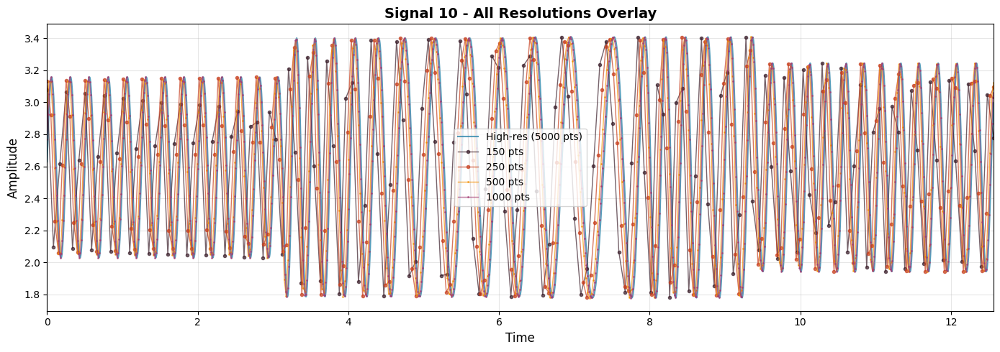

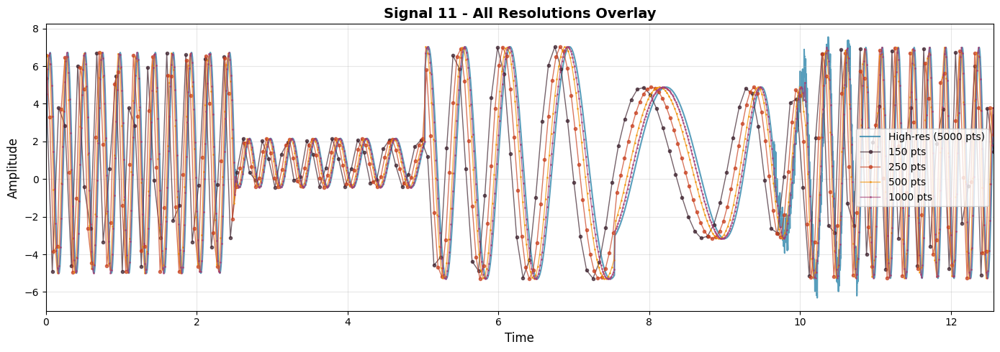

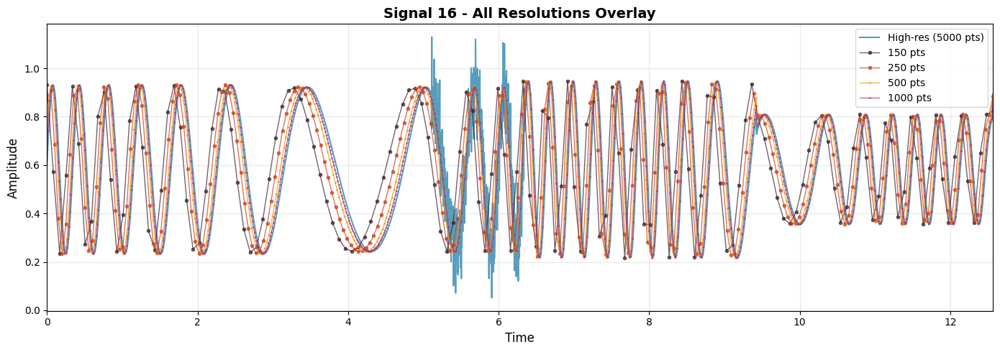

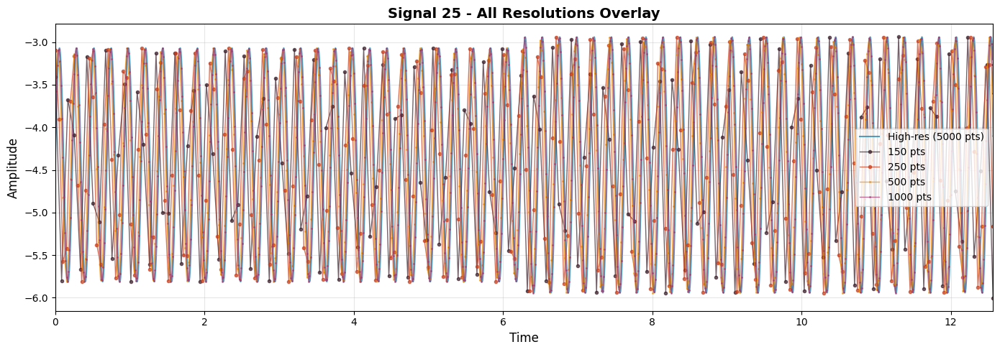

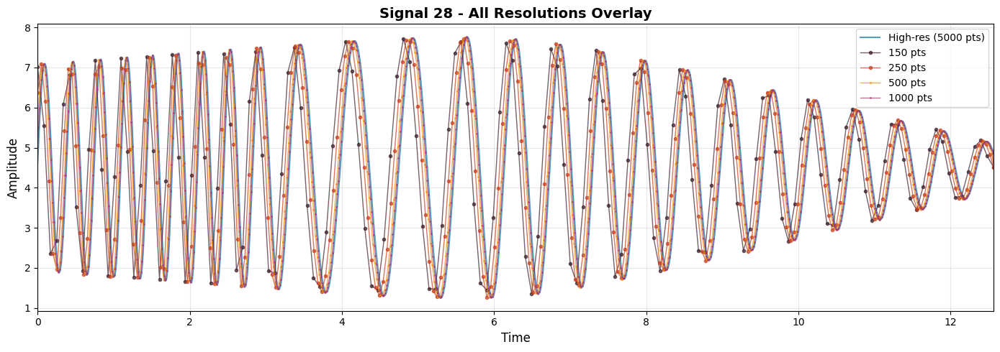

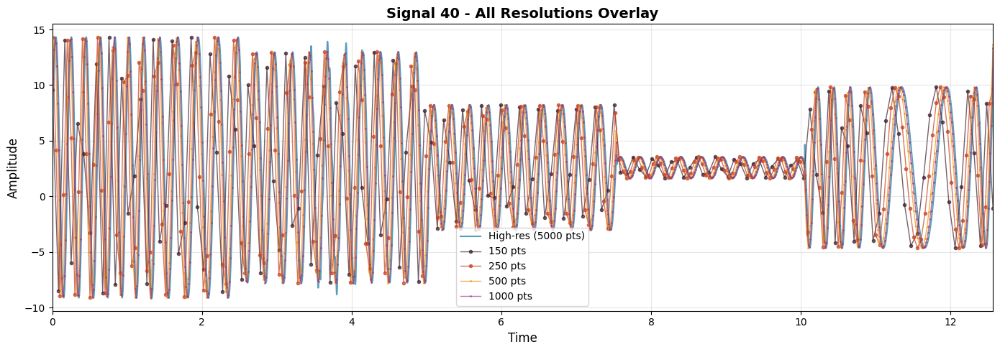

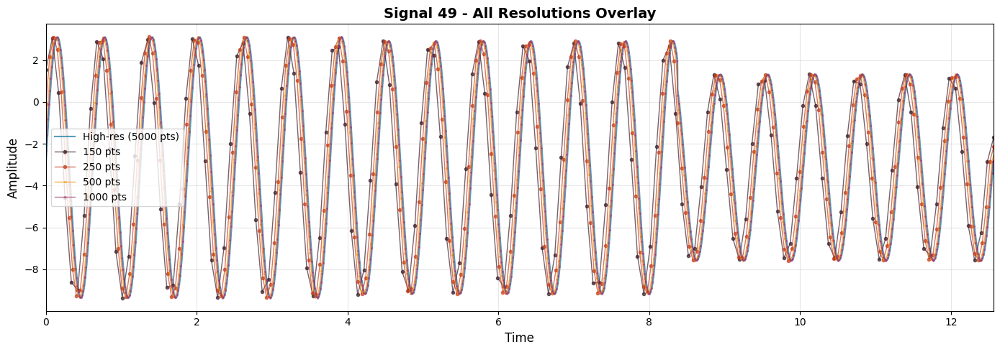

In [21]:
# Generate overlay plots for selected signals
print("Generating overlay comparison plots...\n")

for idx in selected_indices:
    plot_signal_overlay(idx, signals_high, t_high, subsampled_data, subsample_sizes)

## Zoomed View Comparison

Zoom into a specific time window to better see the differences between resolutions.

In [22]:
def plot_signal_zoomed(idx, signals_high, t_high, subsampled_data, subsample_sizes, 
                       zoom_start=0.3, zoom_end=0.5):
    """
    Plot a zoomed view of a signal at all resolutions.
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    
    # Full signal
    ax1 = axes[0]
    ax1.plot(t_high, signals_high[idx], color=colors['high'], linewidth=1, alpha=0.8, 
             label='High-res')
    ax1.axvspan(zoom_start, zoom_end, alpha=0.2, color='yellow', label='Zoom region')
    ax1.set_title(f'Signal {idx} - Full View', fontweight='bold')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Amplitude')
    ax1.legend(loc='upper right')
    ax1.grid(True, alpha=0.3)
    
    # Zoomed view
    ax2 = axes[1]
    
    # High-res in zoom
    mask_high = (t_high >= zoom_start) & (t_high <= zoom_end)
    ax2.plot(t_high[mask_high], signals_high[idx][mask_high], color=colors['high'], 
             linewidth=2, alpha=0.8, label=f'High-res ({len(t_high)} pts)')
    
    # Subsampled in zoom
    for size in sorted(subsample_sizes, reverse=True):
        t_sub = subsampled_data[size]['t']
        signal_sub = subsampled_data[size]['signals'][idx]
        mask_sub = (t_sub >= zoom_start) & (t_sub <= zoom_end)
        
        ax2.plot(t_sub[mask_sub], signal_sub[mask_sub], color=colors[size], 
                 linewidth=1.5, alpha=0.7, marker='o', markersize=4,
                 label=f'{size} pts')
    
    ax2.set_title(f'Signal {idx} - Zoomed [{zoom_start:.2f}, {zoom_end:.2f}]', fontweight='bold')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Amplitude')
    ax2.legend(loc='best')
    ax2.grid(True, alpha=0.3)
    ax2.set_xlim([zoom_start, zoom_end])
    
    plt.tight_layout()
    plt.show()
    return fig

Generating zoomed comparison plots for first 5 selected signals...



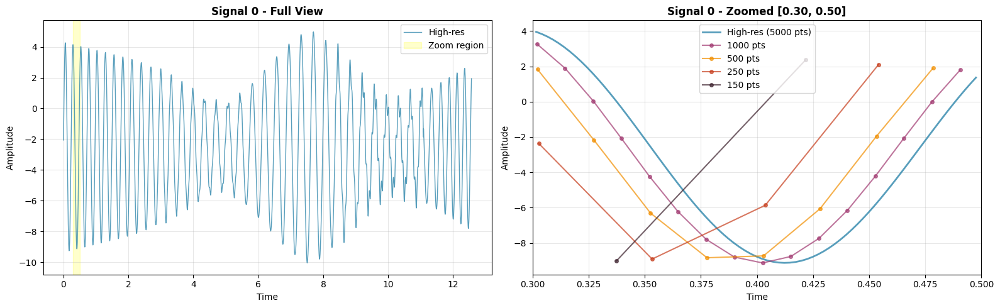

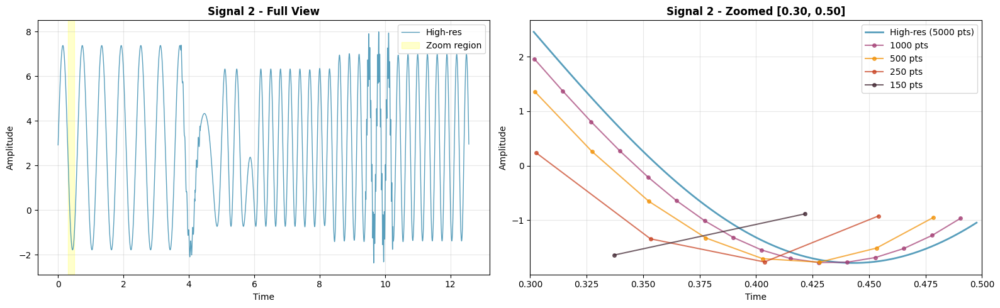

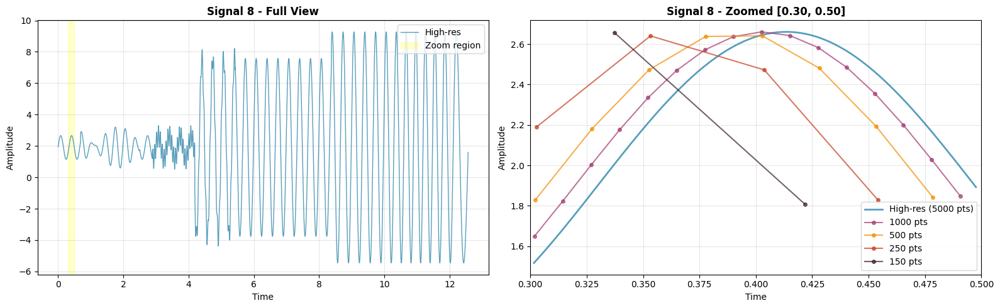

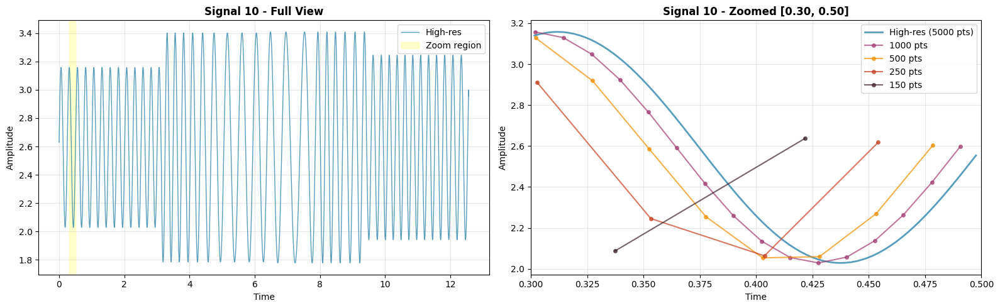

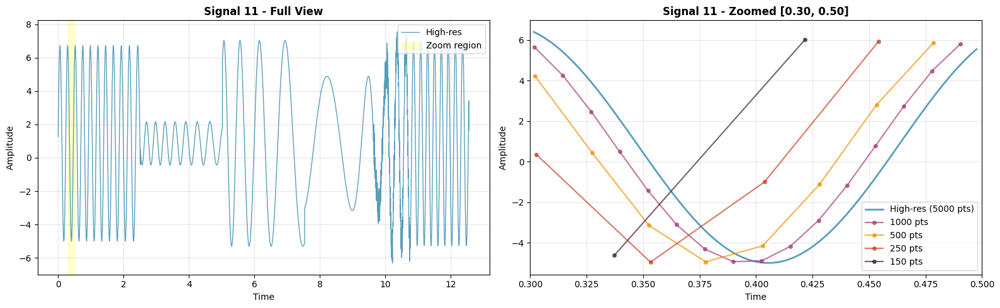

In [23]:
# Generate zoomed plots for a few signals
print("Generating zoomed comparison plots for first 5 selected signals...\n")

for idx in selected_indices[:5]:
    plot_signal_zoomed(idx, signals_high, t_high, subsampled_data, subsample_sizes)

## Summary Statistics

In [24]:
print("=" * 60)
print("VISUALIZATION SUMMARY")
print("=" * 60)
print(f"\nSignals visualized: {NUM_SIGNALS_TO_PLOT}")
print(f"Signal indices: {list(selected_indices)}")
print(f"\nResolutions displayed:")
print(f"  - High resolution: {len(t_high)} samples")
for size in sorted(subsample_sizes, reverse=True):
    print(f"  - Subsampled: {size} samples")
print(f"\nTotal plots generated:")
print(f"  - Multi-subplot figures: {NUM_SIGNALS_TO_PLOT} × {1 + len(subsample_sizes)} = {NUM_SIGNALS_TO_PLOT * (1 + len(subsample_sizes))} plots")
print(f"  - Overlay figures: {NUM_SIGNALS_TO_PLOT}")
print(f"  - Zoomed figures: 5 × 2 = 10 plots")
print(f"\nSubsampling method: {summary['subsample_method']} (no anti-aliasing filter)")

VISUALIZATION SUMMARY

Signals visualized: 10
Signal indices: [np.int64(0), np.int64(2), np.int64(8), np.int64(10), np.int64(11), np.int64(16), np.int64(25), np.int64(28), np.int64(40), np.int64(49)]

Resolutions displayed:
  - High resolution: 5000 samples
  - Subsampled: 1000 samples
  - Subsampled: 500 samples
  - Subsampled: 250 samples
  - Subsampled: 150 samples

Total plots generated:
  - Multi-subplot figures: 10 × 5 = 50 plots
  - Overlay figures: 10
  - Zoomed figures: 5 × 2 = 10 plots

Subsampling method: simple (no anti-aliasing filter)
